In [1]:
import ImageView: imshow
import Images: Gray
import TestImages: testimage

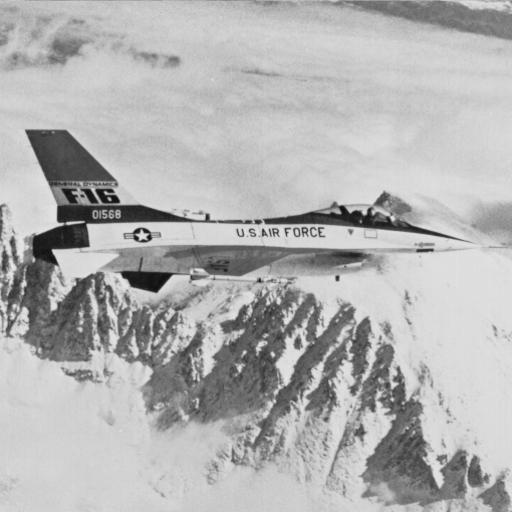

In [3]:
jetplane = 1*Gray.(testimage("jetplane"))

In [4]:
typeof(jetplane)

Matrix{Gray{Float32}} (alias for Array{Gray{Float32}, 2})

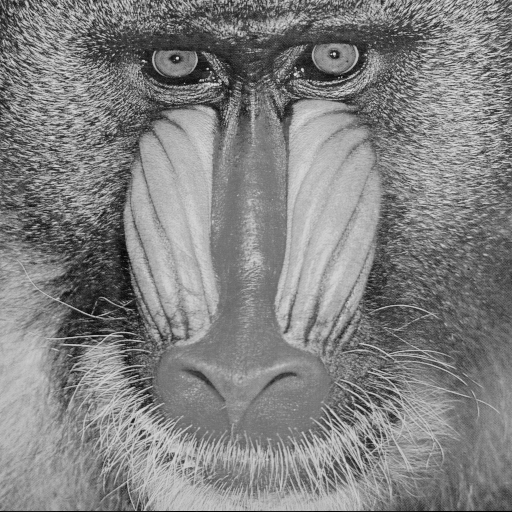

In [5]:
mandrill = 1*Gray.(testimage("mandrill"))

In [6]:
function normalize_image(im)
    im_res = im .- minimum(im)
    return (1/maximum(im_res))*im_res
end

normalize_image (generic function with 1 method)

In [7]:
j = convert(Matrix{Float32}, jetplane)     
m = convert(Matrix{Float32}, mandrill)

512×512 Matrix{Float32}:
 0.568627   0.219608   0.192157   0.34902   …  0.443137  0.6        0.694118
 0.454902   0.396078   0.156863   0.262745     0.509804  0.584314   0.490196
 0.301961   0.447059   0.180392   0.180392     0.392157  0.345098   0.317647
 0.278431   0.533333   0.372549   0.188235     0.286275  0.294118   0.27451
 0.341176   0.478431   0.517647   0.196078     0.231373  0.313726   0.337255
 0.321569   0.298039   0.623529   0.239216  …  0.333333  0.596078   0.713726
 0.168627   0.2        0.52549    0.509804     0.72549   0.776471   0.643137
 0.129412   0.2        0.435294   0.6          0.631373  0.470588   0.541176
 0.223529   0.188235   0.219608   0.458824     0.529412  0.611765   0.478431
 0.14902    0.12549    0.188235   0.25098      0.254902  0.317647   0.533333
 0.129412   0.168627   0.223529   0.145098  …  0.254902  0.286275   0.266667
 0.129412   0.184314   0.305882   0.141176     0.34902   0.290196   0.294118
 0.141176   0.262745   0.352941   0.254902     0.301

In [8]:
import LinearAlgebra: transpose, norm

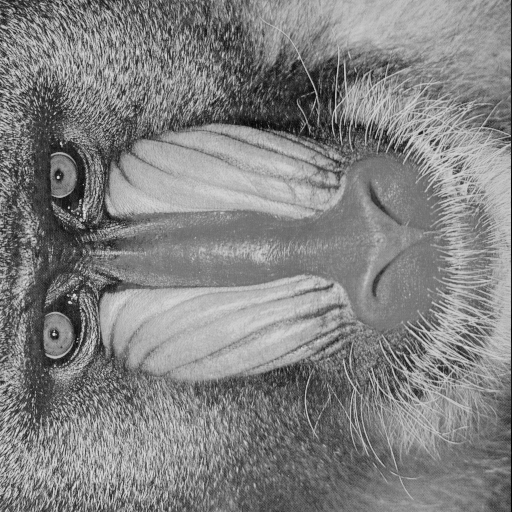

In [9]:
transpose(mandrill)

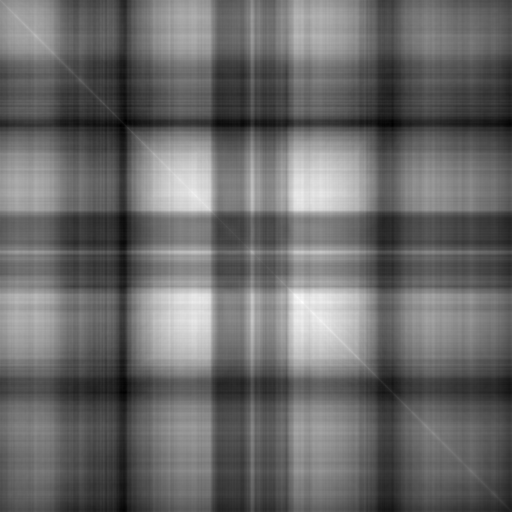

In [10]:
Gray.(normalize_image(transpose(m)*m))

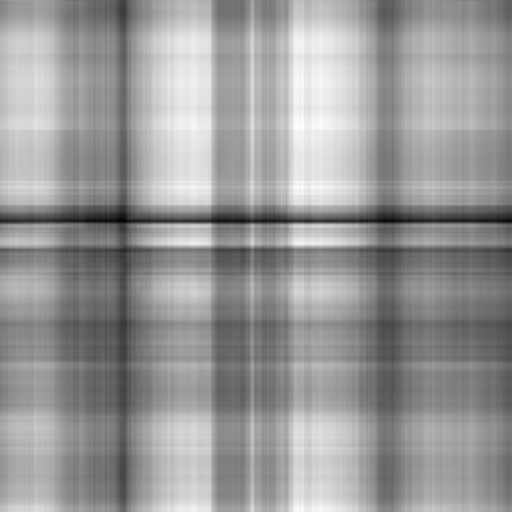

In [11]:
Gray.(normalize_image(j*m))

In [12]:
norm_columns(f, x) = f.(x) ./ sum(f.(x), dims=1)

norm_rows(f, x) = f.(x) ./ sum(f.(x), dims=2)

norm_rows (generic function with 1 method)

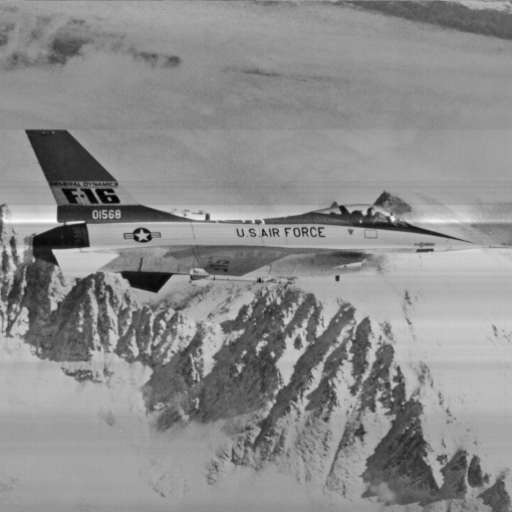

In [13]:
nr_j = normalize_image(norm_rows(x -> x+1, j))
Gray.(nr_j)

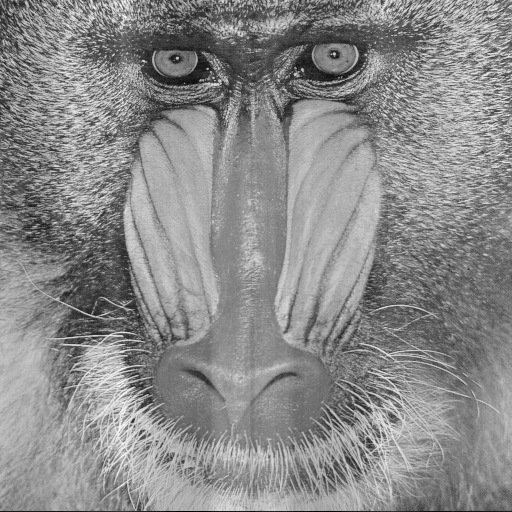

In [14]:
nc_m = normalize_image(norm_columns(x -> x+1, m))
Gray.(nc_m)

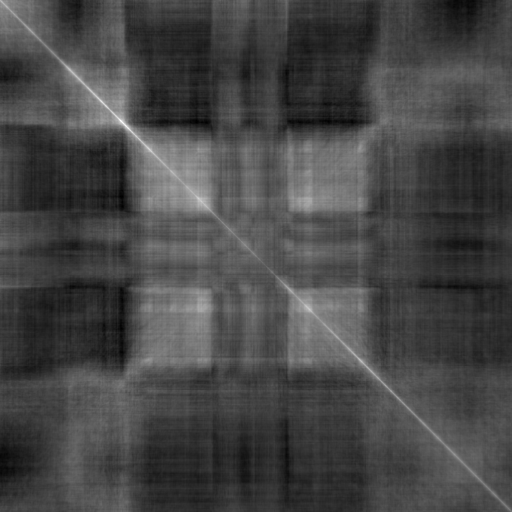

In [15]:
Gray.(normalize_image(transpose(nc_m)*nc_m))

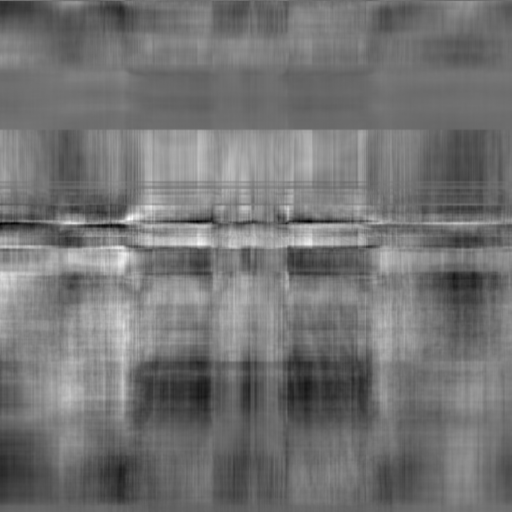

In [16]:
Gray.(normalize_image(nr_j*nc_m))

In [17]:
function warp3(x, y, p) # 0:31
    knob = p[:knob]
    clip(n, nsize) = max(min(nsize, n), 1)
    (xnew, ynew) =
        (clip(x + 10 * ((knob - 16) / 16) * sin(y/4), p[:xsize]), y)
    xnew, ynew
end

warp3 (generic function with 1 method)

In [18]:
function apply_warp(warp, im, p)
    (xsize, ysize) = size(im)
    p[:xsize] = xsize
    p[:ysize] = ysize
    function linear_interpolation(x_y)
        # a rough draft, this can be improved; works on im
        x = x_y[1]
        y = x_y[2]
        dx=mod(x,1)
        dy=mod(y,1)
        x_left = floor(Int,x)
        y_left = floor(Int,y)
        x_right = min(x_left + 1, xsize)
        y_right = min(y_left + 1, ysize)
        im[x_left,y_left]*(1-dx)*(1-dy) + im[x_left,y_right]*(1-dx)*dy + im[x_right,y_left]*dx*(1-dy) + im[x_right, y_right]*dx*dy
    end
    [linear_interpolation(warp(x,y,p)) for x in 1:xsize, y in 1:ysize]
end

apply_warp (generic function with 1 method)

In [19]:
pars = Dict(:knob=>0, :dummy=>0.0)
# at least one of the above should be float and not integer, so that the dictionary type is
# Dict{Symbol, Real}  and not Dict{Symbol, Int64}

Dict{Symbol, Real} with 2 entries:
  :dummy => 0.0
  :knob  => 0

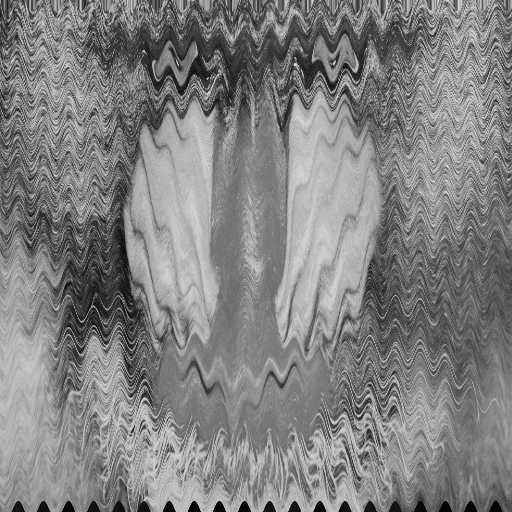

In [20]:
m_warped = apply_warp(warp3, m, pars)
Gray.(m_warped)

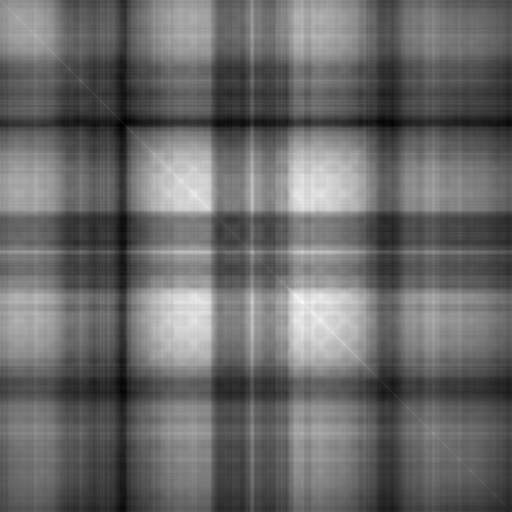

In [22]:
Gray.(normalize_image(transpose(m_warped)*m_warped))

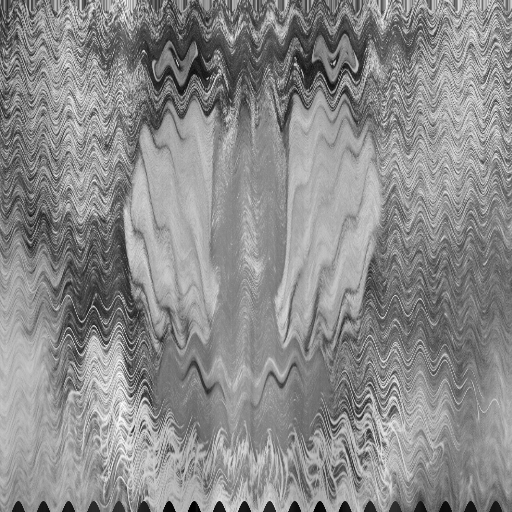

In [23]:
nc_m_warped = normalize_image(norm_columns(x -> x+1, m_warped))
Gray.(nc_m_warped)

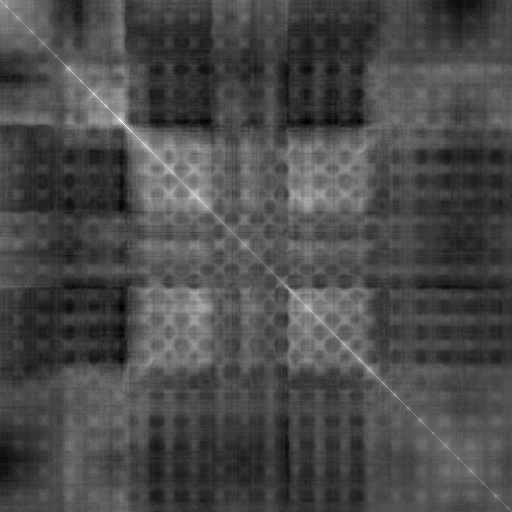

In [24]:
Gray.(normalize_image(transpose(nc_m_warped)*nc_m_warped))

In [25]:
transposed_product(x) = normalize_image(transpose(x)*x)

transposed_product (generic function with 1 method)

In [26]:
value3(A) = transposed_product(norm_columns(x -> x+1, A))

value3 (generic function with 1 method)

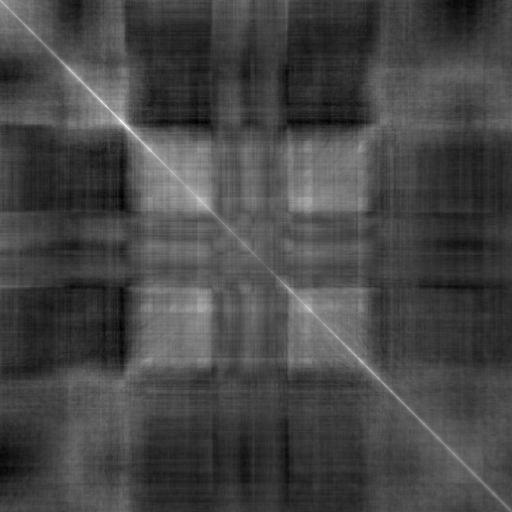

In [27]:
Gray.(value3(m))

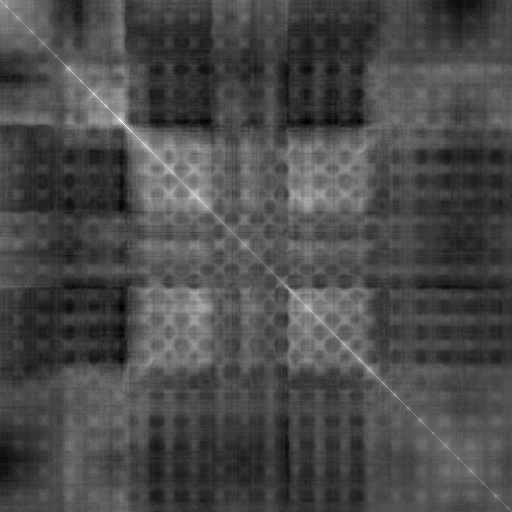

In [28]:
Gray.(value3(m_warped))

In [29]:
loss(x, y) = norm(value3(x) - y)

loss (generic function with 1 method)

In [30]:
using Flux

┌ Error: This version of CUDA.jl only supports NVIDIA drivers for CUDA 11.x or higher (yours is for CUDA 10.2.0)
└ @ CUDA C:\Users\anhin\.julia\packages\CUDA\tVtYo\src\initialization.jl:70


In [31]:
# we are using CPU in these experiments
# here is the package version
using Pkg
Pkg.status("Flux")

Status `C:\Users\anhin\.julia\environments\v1.9\Project.toml`
⌃ [587475ba] Flux v0.13.17
Info Packages marked with ⌃ have new versions available and may be upgradable.


In [32]:
# interestingly, my system resists upgrading to Flux v0.14.0

In [33]:
opt = ADAM()

Adam(0.001, (0.9, 0.999), 1.0e-8, IdDict{Any, Any}())

In [34]:
import Flux.Optimise: update!

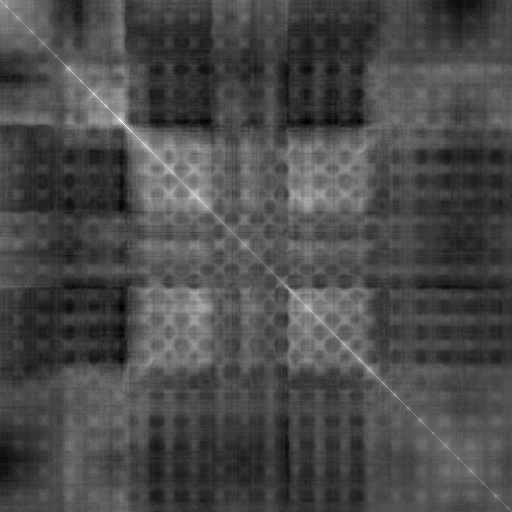

In [35]:
target_value = value3(m_warped)
Gray.(target_value)

In [36]:
loss(m, target_value)

20.400127148541408

In [41]:
function steps!(x, y, loss, opt, accum, n_steps = 1)
    for i = 1:n_steps
        p = Flux.params(x) # unqualified "params" no longer works
        push!(accum, deepcopy(x)) # I am unhappy about the loss of intermediate parameter values
        grads = gradient(()->loss(x, y), p)
        update!(opt, p, grads)
        println(loss(x, y))
    end
    loss(x, y)
end

steps! (generic function with 2 methods)

In [42]:
m_list = []

Any[]

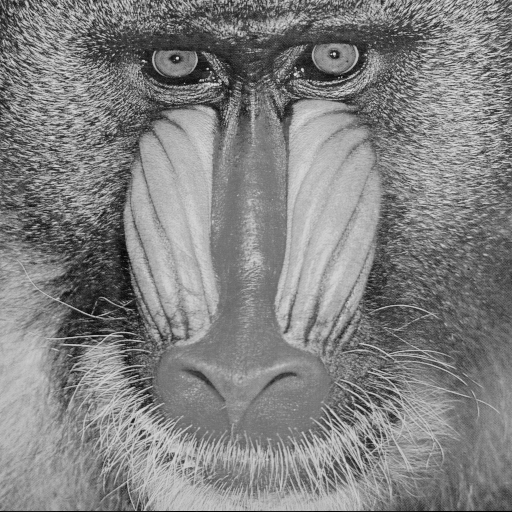

In [43]:
changing_m = deepcopy(m)
Gray.(changing_m)

In [44]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

18.930630322983284
17.998412994021663
17.49102277368788
17.132622834789604
16.851330043092876
16.59138300427991
16.32518628459641
16.042357027015182
15.753423332776885
15.47115470152106
15.2086242531216
14.971513118070408
14.756666971926457
14.554267388137148
14.352972296621905
14.14325650605451
13.928514170489615
13.71113797794682
13.5001301430233
13.3023172545383
13.120663717919092
12.952517498460958
12.791379084515114
12.63171537971038
12.467386258467764
12.300004974523647
12.133476944418415
11.971943429237648
11.81796635813659
11.670381784500519


11.670381784500519

In [45]:
length(m_list)

30

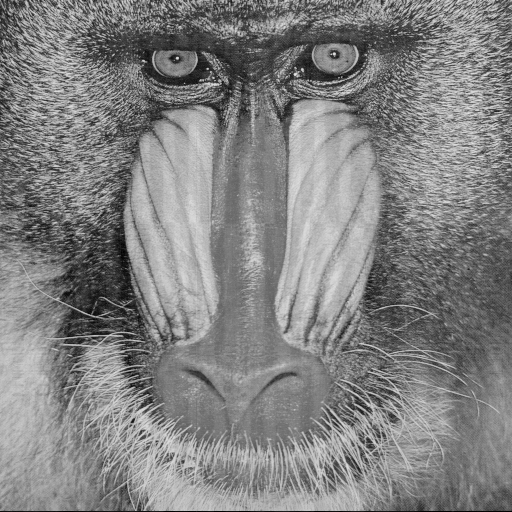

In [46]:
Gray.(changing_m)

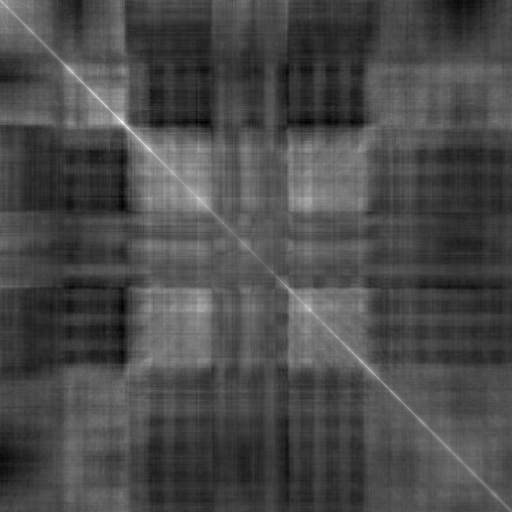

In [47]:
Gray.(value3(changing_m))

In [48]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

11.526739818603875
11.38280245640359
11.238307833650593
11.09335347166101
10.951457861900067
10.814259638829801
10.681433542509787
10.552453535475477
10.421454698092477
10.291258097262999
10.158899377100703
10.03381253150907
9.894362130728604
9.764308959092586
9.635956772976328
9.507931407987302
9.378682145237896
9.24826697539821
9.117780360634505
8.987843818611676
8.858797025736573
8.72995112489665
8.600616033427393
8.470746647333073
8.341620463018307
8.213794969468852
8.087860216197463
7.96342574762167
7.840354204696677
7.719358754134435


7.719358754134435

In [49]:
length(m_list)

60

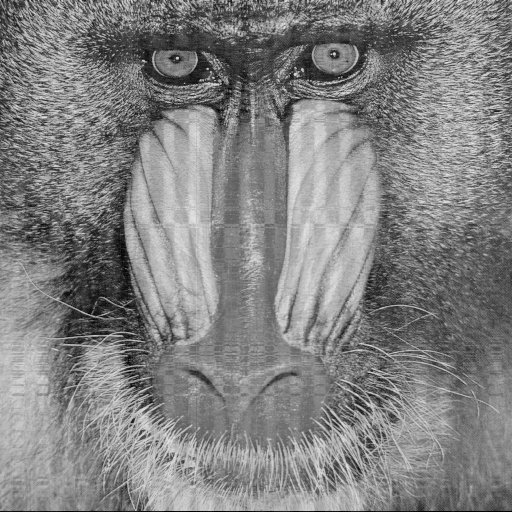

In [50]:
Gray.(changing_m)

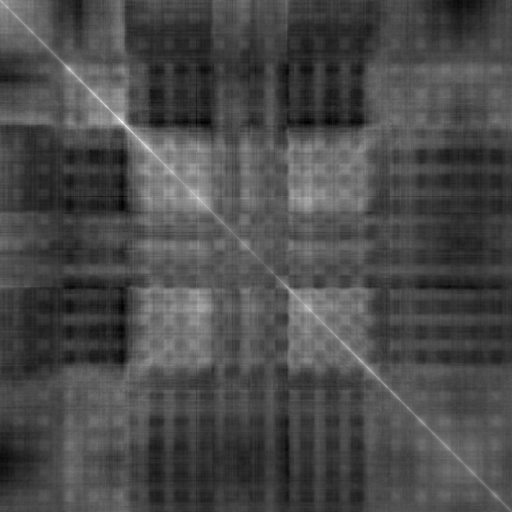

In [51]:
Gray.(value3(changing_m))

In [52]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

7.600912377576158
7.485591995418416
7.37334664307288
7.263844980380444
7.157537962454874
7.054707191562699
6.955754187614987
6.860665002785269
6.768340822799051
6.679453482183794
6.593819271025727
6.511279036891689
6.431469095239818
6.354007833003269
6.278767043008877
6.20598195436429
6.1350226435219755
6.0656899524987065
5.997885258813515
5.93155561758719
5.866623936642296
5.802875888399832
5.740162637693107
5.678694377315553
5.618268629449879
5.558892940290554
5.500436629984693
5.442955142677361
5.386420607325565
5.330825464200721


5.330825464200721

In [53]:
length(m_list)

90

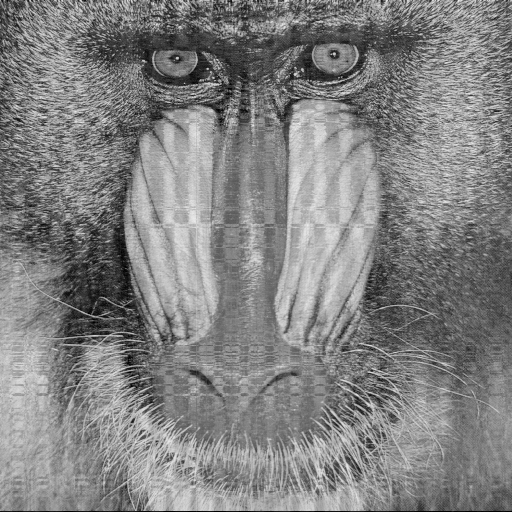

In [54]:
Gray.(changing_m)

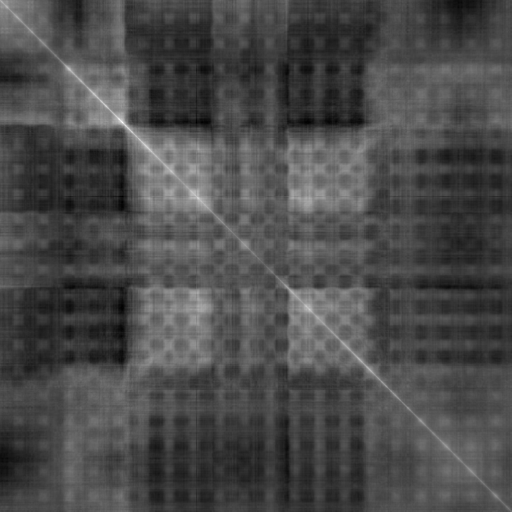

In [55]:
Gray.(value3(changing_m))

In [56]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

5.275976272056039
5.2219149278324
5.168701189951037
5.116133779452806
5.064183655560354
5.0128536416703575
4.962186251298247
4.911989859002138
4.862277438938646
4.81315430918578
4.764467078529363
4.716199941465463
4.6683792181494645
4.621049412546631
4.574177628117852
4.527806890080921
4.481876015212424
4.436394680129543
4.391442173495224
4.346871723273367
4.302855675713889
4.259239614352824
4.216151641704505
4.173445894019767
4.131211533935721
4.0894101756659476
4.048066868251233
4.007113281503297
3.9665921900606205
3.926409974062284


3.926409974062284

In [57]:
length(m_list)

120

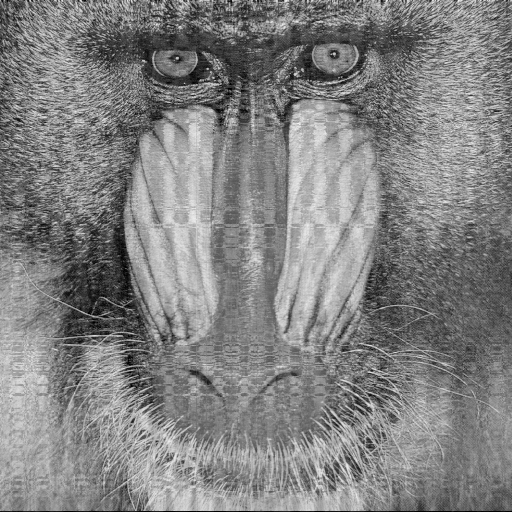

In [58]:
Gray.(changing_m)

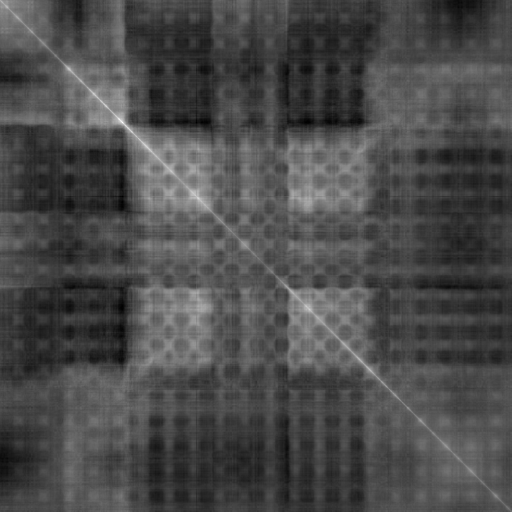

In [59]:
Gray.(value3(changing_m))

In [60]:
@time steps!(changing_m, target_value, loss, opt, m_list, 180)

3.8866718291465823
3.847326018612398
3.808281748832393
3.769669423487435
3.7313615436245016
3.6934794498769747
3.6559574913149726
3.6187428502713206
3.5818731654034597
3.545369325186703
3.5090859369409544
3.4731834351680475
3.4375963511118313
3.4022775342300577
3.36727914066531
3.332612993013531
3.2981690450640078
3.2640407223629544
3.2301917039557213
3.1965997762358644
3.1632846640108543
3.1301893450776914
3.097377082744058
3.064873288120281
3.032485704214577
3.00045320919473
2.96854321003529
2.936981278881347
2.9055107213777016
2.8743654773529497
2.843354378641152
2.812583160670396
2.7820591257692238
2.7517335262059492
2.7215976553494174
2.6916315195937033
2.6619144427626753
2.6323965657245765
2.603046607957928
2.5738926912967863
2.5449404871051207
2.5161874168659493
2.487581421998561
2.4591989952599485
2.4309924333376456
2.402958632159295
2.3751510694180773
2.347469199680888
2.3200752833522347
2.2927351012575814
2.2657296985453006
2.238748450418085
2.212111773056275
2.18548199482403

1.1091367994661507

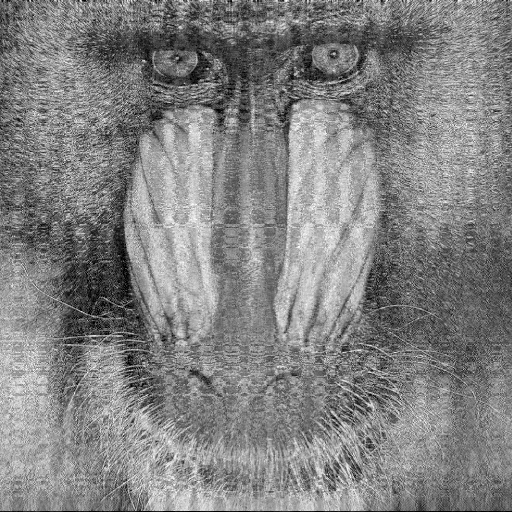

In [61]:
Gray.(changing_m)

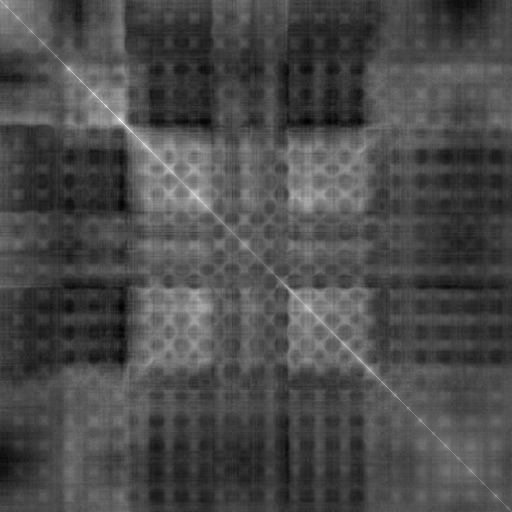

In [62]:
Gray.(value3(changing_m))

In [63]:
length(m_list)

300

In [64]:
steps!(changing_m, target_value, loss, opt, m_list, 200)

0.8600573846513565
0.9062581982815592
0.8268565958734395
0.8247147716423174
0.7052875399295013
0.6290463541394195
0.7592728838924552
0.5505546845877911
0.5959469646887537
0.677339436428565
0.4954043042947016
0.6271405390936908
0.568691162371596
0.49296206491876604
0.5798289102049946
0.5310500541235241
0.4920275615026299
0.5766884735271431
0.5153069161400526
0.5155724915898362
0.5471782252097939
0.48817333955915576
0.5217248482846464
0.5153622588368226
0.4698382837307435
0.5050196321207615
0.479940284214982
0.44499229709436516
0.4775424661602882
0.4495482430980171
0.4136521940794909
0.45407742291271297
0.4345584906046658
0.3899997491759997
0.4101470865654692
0.4136430861255923
0.3921595331517371
0.3721879069883869
0.36343306565215655
0.375598026457074
0.3705511445761895
0.36238491631859254
0.34843211866764373
0.3395817296712867
0.3376836132849865
0.3340565556952359
0.3412028296333131
0.3483735650883642
0.36061920220298604
0.35168852649684634
0.3332021955704288
0.3199916885738772
0.31205

0.15353120162518047

In [65]:
length(m_list)

500

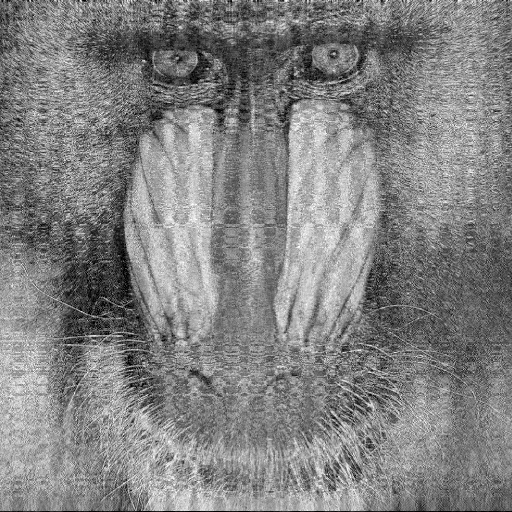

In [66]:
Gray.(changing_m)

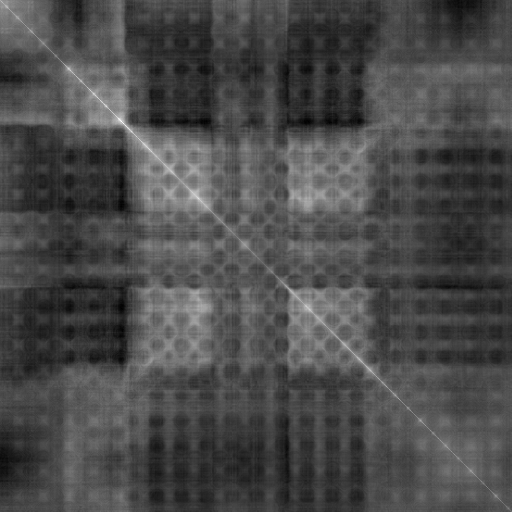

In [67]:
Gray.(value3(changing_m))